In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
sys.path.append('/fs/cbsuvlaminck2/workdir/bmg224/hiprfish/image_analysis_code')
from segmentation import Segmentation
from image import Image
import image_functions as imfn
from tqdm import tqdm

In [12]:
data_dir = '/fs/cbsuvlaminck2/workdir/bmg224/data/2021/devlaminck_widefield/2021_04_05_dnafishmethodchar'
factors = ['method', 'plasmid', 'fov']
flat_field_filename = '/fs/cbsuvlaminck2/workdir/bmg224/data/2021/devlaminck_widefield/2021_04_12_flat_field_correction_lens_100x_refl_cy5.czi'
flat_field_index = 0
sample_names = imfn.get_sample_names(data_dir=data_dir)
print(len(sample_names))
refl = ['gfp', 'cy5']

50


In [4]:
keys = [imfn.get_filename_keys(sn, filename_factors=factors) for sn in sample_names]
key_labels = [", ".join(k) for k in keys]
print(len(keys))

50


In [5]:
sn_dict = imfn.get_nested_dict(keys, sample_names, [0,1])
I = ['a','b','c','d','e','f','g']
J = ['neg','pos']
sn_sort = []
key_labels = []
for i in I:
    for j in J:
        for key, sn in sn_dict[i][j]:
            sn_sort.append(sn)
            key_labels.append(', '.join(key))

In [13]:
sn = sn_dict['g']['pos'][1][1]
print(sn)
seg = Segmentation(sample_name=sn, illumination_names=refl, data_dir=data_dir, 
                   flat_field_filename=flat_field_filename, 
                   flat_field_index=flat_field_index)

2021_04_05_dnafishmethodchar_method_g_plasmid_pos_fov_1


In [15]:
dims=(10,10)
clims=(0.1, 0.4)

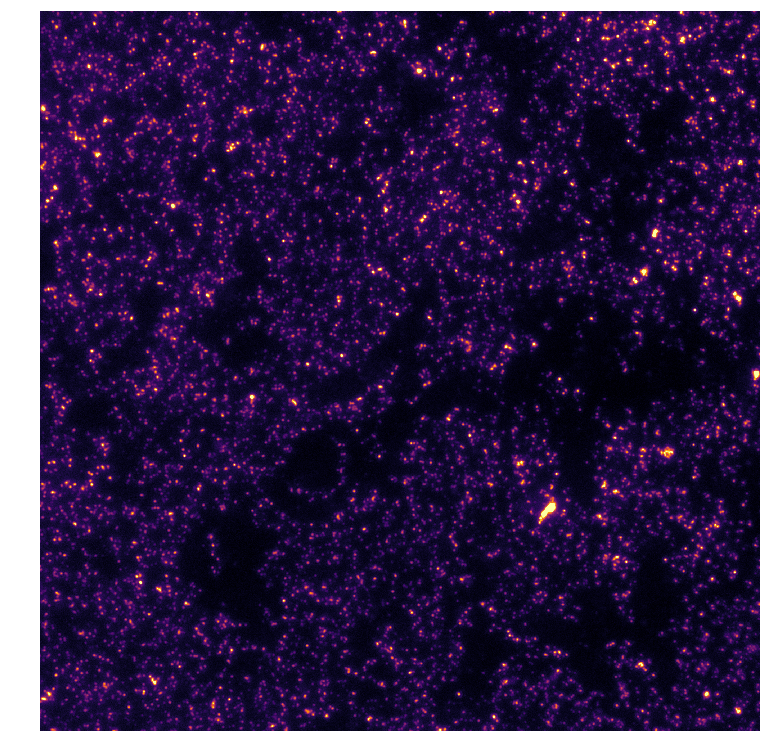

In [16]:
seg.pick_channel('cy5')
seg.flat_field_correction()
seg.save_intensity_image(image=seg.raw_2D, dims=dims, clims=clims, save=False)

In [44]:
import pandas as pd
import ast
zc_df = pd.read_csv('../image_processing/rgb_zoom_coords.csv')
zc_str = zc_df.loc[zc_df.sample_name == sn, 'coords'].values[0]
zoom_coords = ast.literal_eval(zc_str)
print(zoom_coords)
zoom_coords = (262, 562, 1591, 1891) 

(262, 362, 1791, 1891)


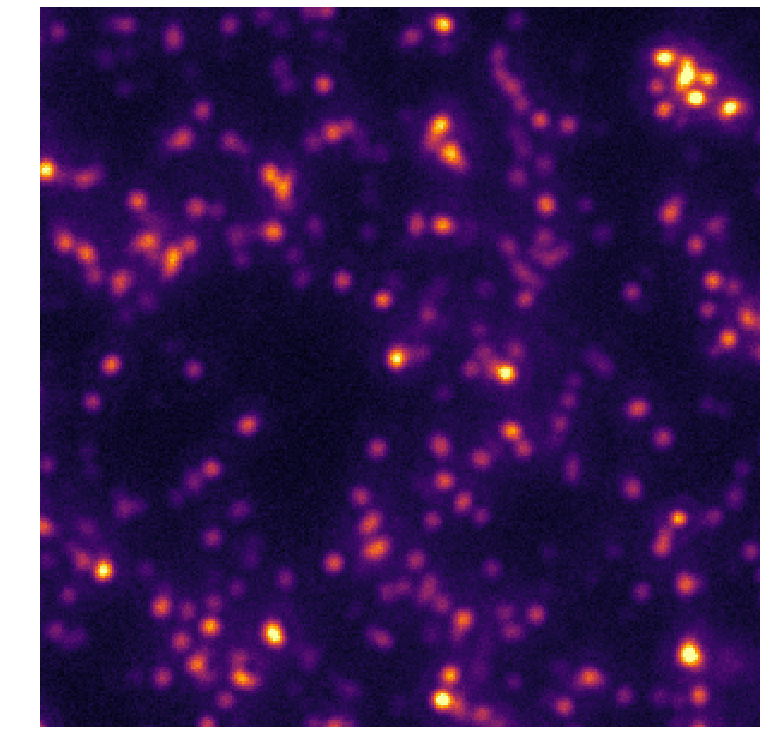

In [38]:
# Show zoom region
seg.save_intensity_image(image=seg.raw_2D, dims=dims, clims=clims, zoom_coords=zoom_coords,
                         save=False)

In [33]:
# Nice!
# Now do the segmentation
seg.segment()

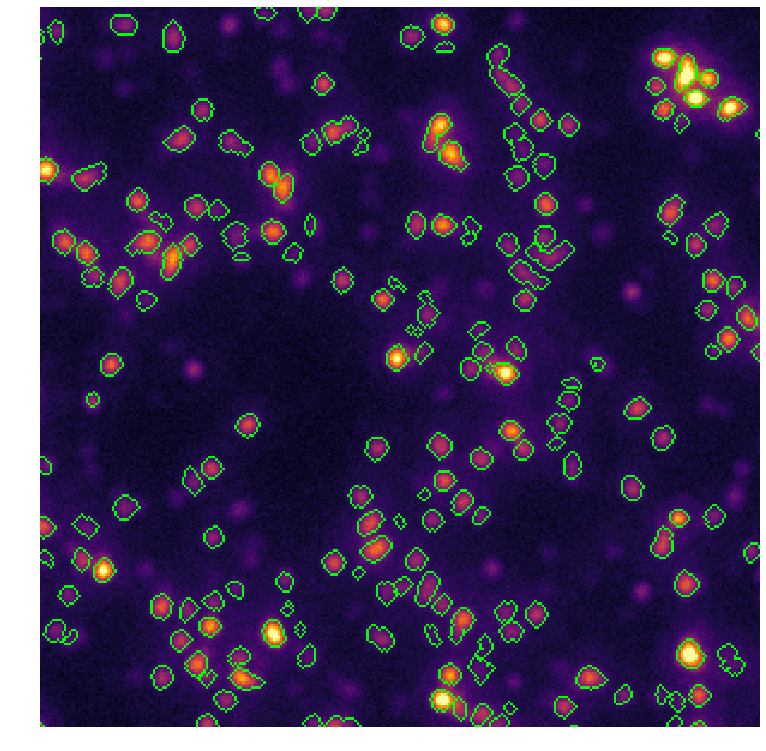

In [39]:
# Show the zoom results
seg.save_seg(dims=dims, clims=clims, zoom_coords=zoom_coords, save=False)

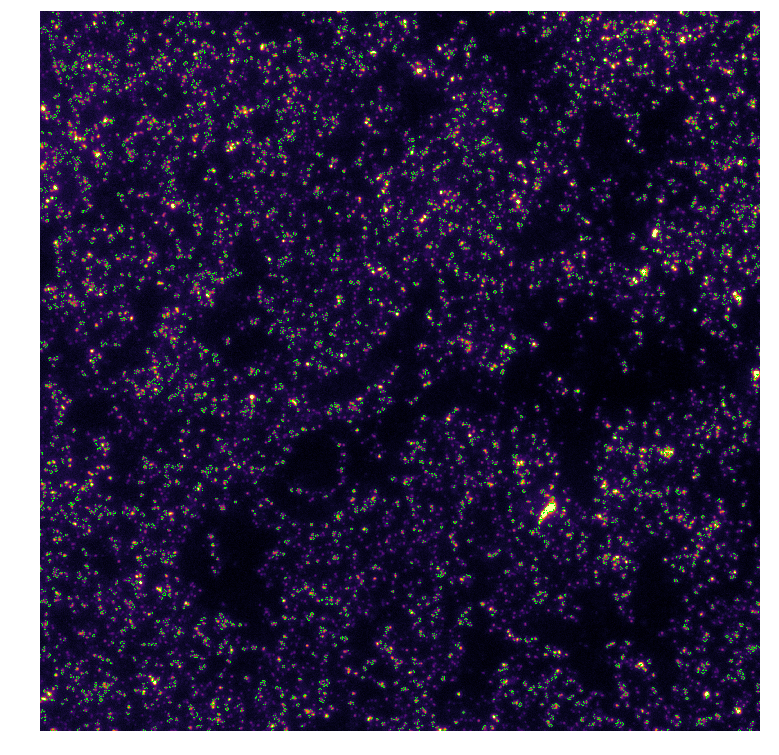

In [35]:
# Show the full results
seg.save_seg(dims=dims, clims=clims, save=False)

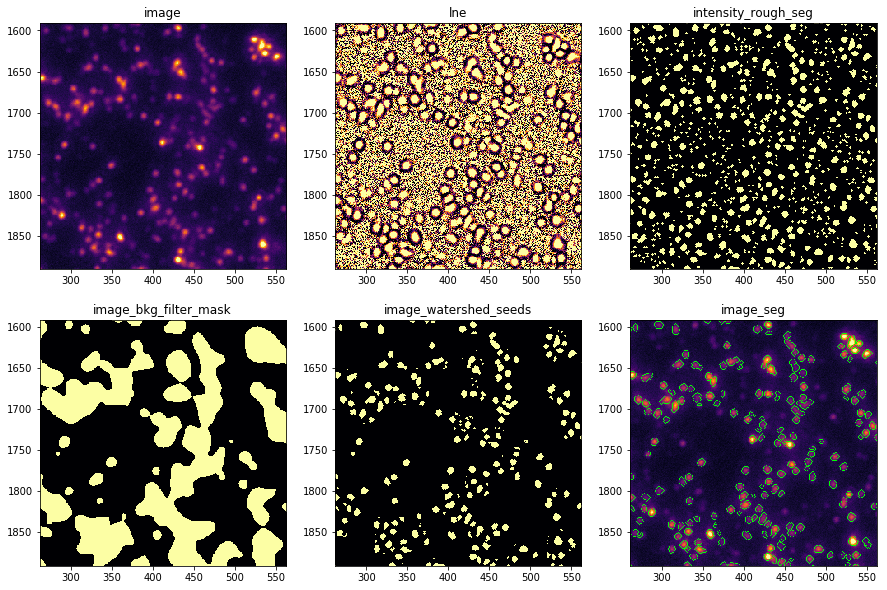

In [41]:
# show seg process
seg.save_seg_process(zoom_coords=zoom_coords, clims=clims, dims=(15,10), save=False)

2021_04_05_dnafishmethodchar_method_g_plasmid_pos_fov_1


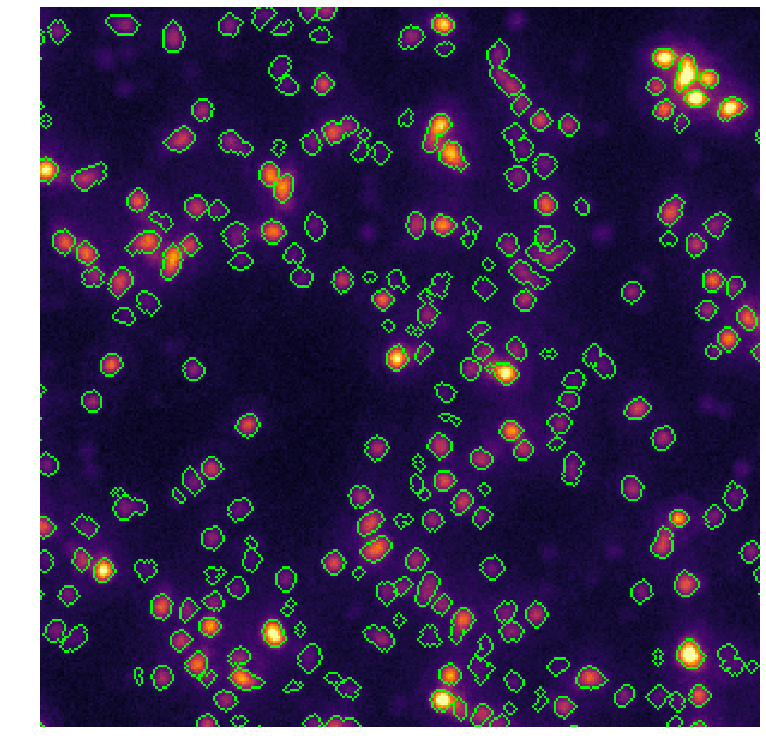

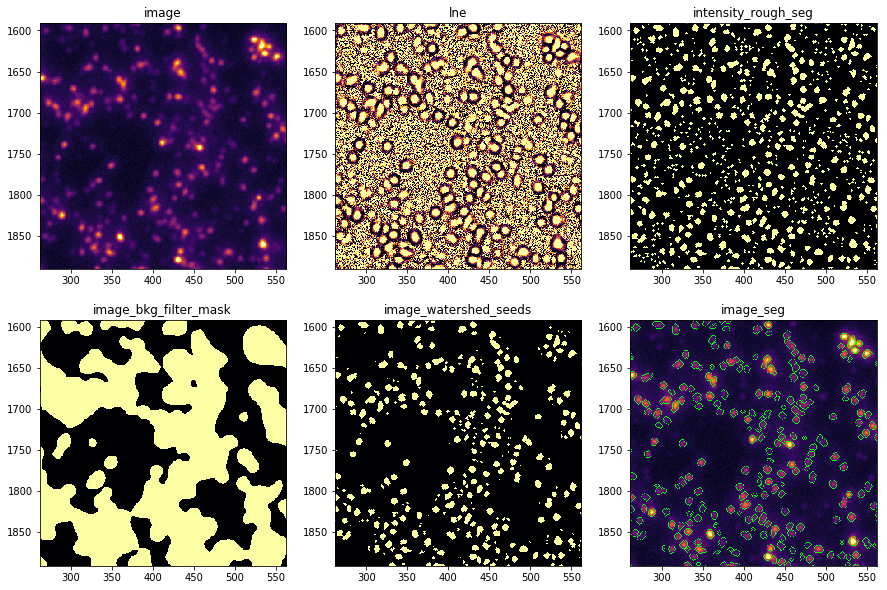

In [42]:
# Now do an altered seg
sn = sn_dict['g']['pos'][1][1]
print(sn)
seg_01 = Segmentation(sample_name=sn, illumination_names=refl, data_dir=data_dir, 
                      flat_field_filename=flat_field_filename, 
                      flat_field_index=flat_field_index,
                      bg_log=True)
seg_01.pick_channel('cy5')
seg_01.flat_field_correction()
seg_01.segment()
seg_01.save_seg(dims=dims, clims=clims, zoom_coords=zoom_coords, save=False)
seg_01.save_seg_process(zoom_coords=zoom_coords, clims=clims, dims=(15,10), save=False)

2021_04_05_dnafishmethodchar_method_g_plasmid_pos_fov_1


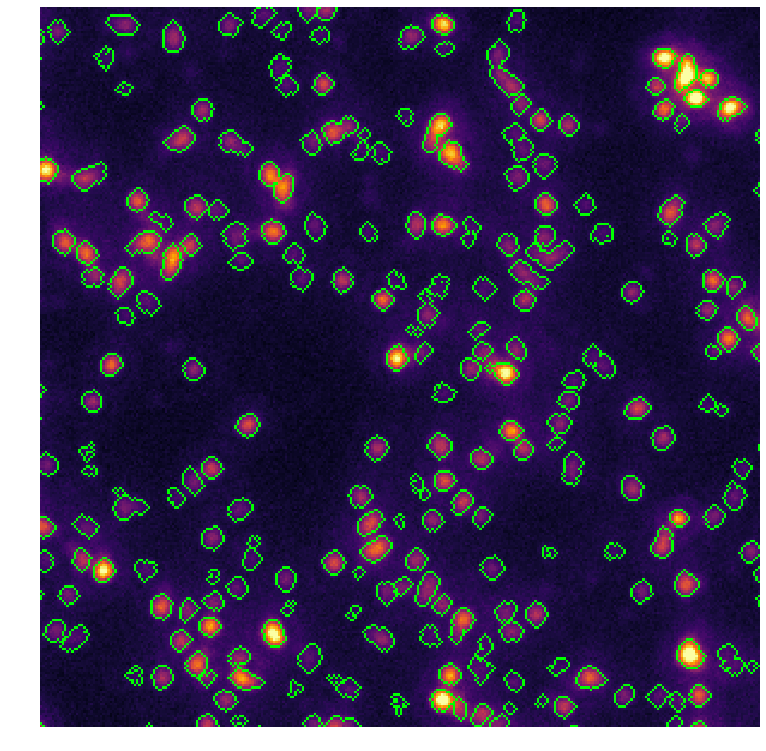

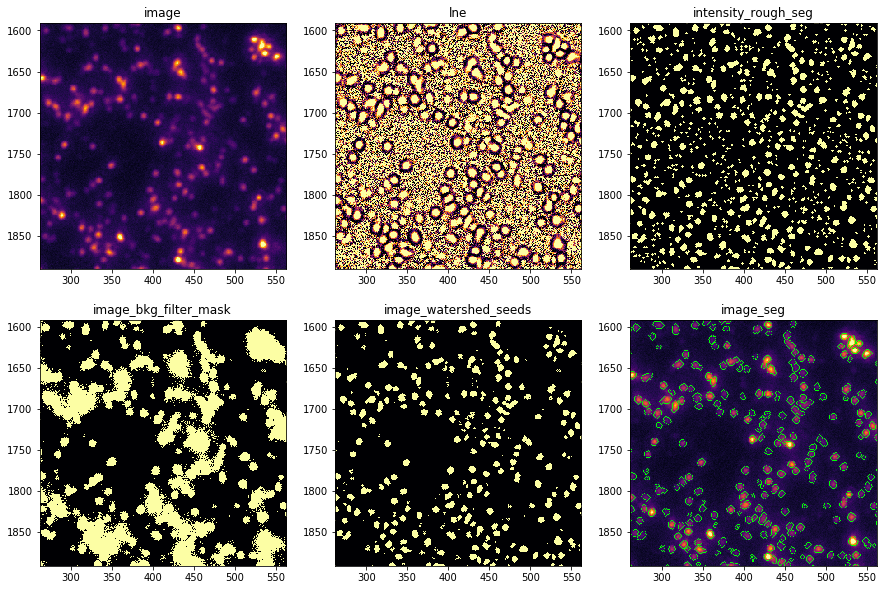

In [66]:
# Now do top two clusters of three cluster
sn = sn_dict['g']['pos'][1][1]
print(sn)
seg_02 = Segmentation(sample_name=sn, illumination_names=refl, data_dir=data_dir, 
                      flat_field_filename=flat_field_filename, 
                      flat_field_index=flat_field_index,
                      bg_log=True, n_clusters=3, top_n_clust=2, bg_smoothing=0)
seg_02.pick_channel('cy5')
seg_02.flat_field_correction()
seg_02.segment()
seg_02.save_seg(dims=dims, clims=clims, zoom_coords=zoom_coords, save=False)
seg_02.save_seg_process(zoom_coords=zoom_coords, clims=clims, dims=(15,10), save=False)

/home/bmg224/miniconda3/envs/hiprfish_imaging/lib/python3.5/site-packages/matplotlib/figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


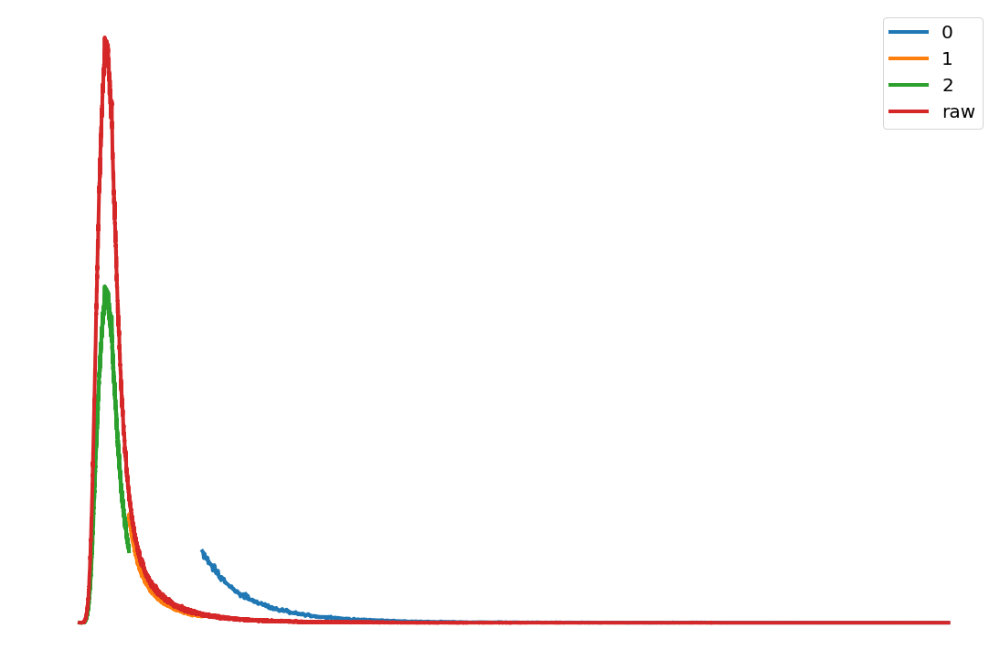

In [64]:
# show the pixel distributions in the three clusters
from sklearn.cluster import MiniBatchKMeans
import numpy as np

im_raw = seg.raw_2D
# cluster
n_clusters = 3
image_bkg_filter = MiniBatchKMeans(n_clusters = n_clusters, 
                                   batch_size = 100000, random_state = 42)
shape_ = im_raw.reshape(np.prod(im_raw.shape), 1)
image_bkg_filter = image_bkg_filter.fit_predict(shape_)
image_bkg_filter = image_bkg_filter.reshape(im_raw.shape)
# Sort clusters in descending order of mean intensity
i_list = []
for n in range(n_clusters):
    image_ = im_raw*(image_bkg_filter == n)
    i_n = np.average(image_[image_ > 0])
    i_list.append(i_n)
i_list = np.argsort(i_list)[::-1]
# Generate intensity arrays for each cluster
c_list = []
for i in i_list:
    filtered = im_raw[image_bkg_filter == i]
    c_list.append(filtered)
# show the histograms
import image_plots as ip
ft = 20
legend=True
fig, ax = ip.general_plot(dims=(15,10), col='w')
i=0
for value_list in c_list:
    y, bin_edges = np.histogram(value_list, bins=1000)
    bin_centers = 0.5*(bin_edges[1:]+bin_edges[:-1])
    y_norm = y
#     y_norm = y/np.max(y)
    ax.plot(bin_centers, y_norm, lw=4, label=i)
    i+=1
y, bin_edges = np.histogram(np.ravel(im_raw), bins=10000)
bin_centers = 0.5*(bin_edges[1:]+bin_edges[:-1])
y_norm = y
#     y_norm = y/np.max(y)
ax.plot(bin_centers, y_norm, lw=4, label='raw')

if legend==True:
    ax.legend(fontsize=ft)
# ax.set_xlim((0.15,0.3))


2021_04_05_dnafishmethodchar_method_d_plasmid_neg_fov_2


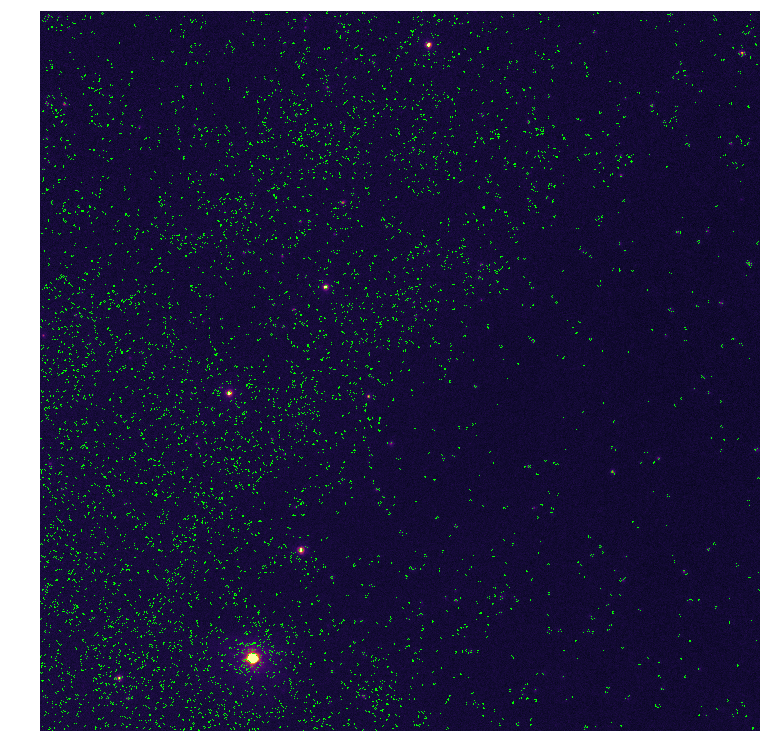

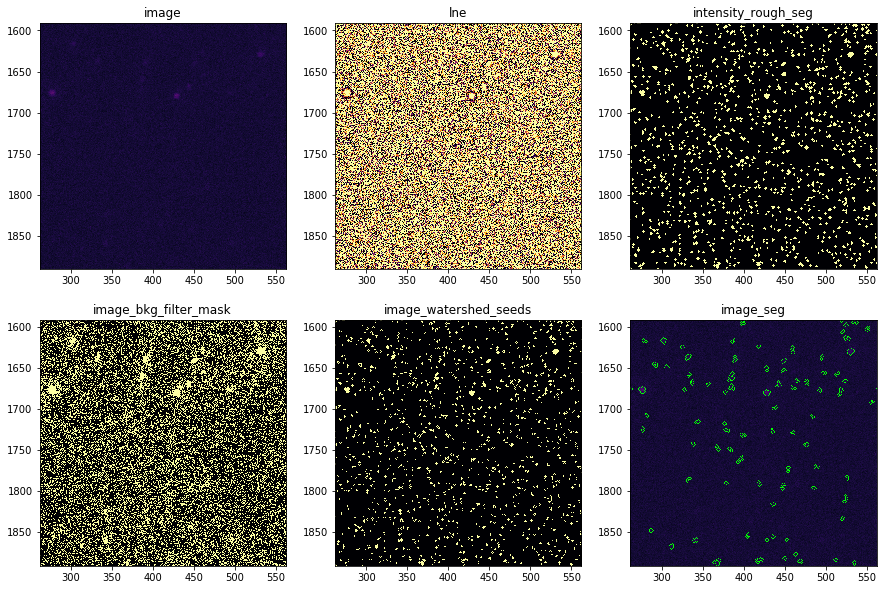

In [71]:
# Okay now find a field of view with overbright blobs
sn = sn_dict['d']['neg'][1][1]
print(sn)
seg_03 = Segmentation(sample_name=sn, illumination_names=refl, data_dir=data_dir, 
                      flat_field_filename=flat_field_filename, 
                      flat_field_index=flat_field_index,
                      bg_log=True, n_clusters=3, top_n_clust=2, bg_smoothing=0)
seg_03.pick_channel('cy5')
seg_03.flat_field_correction()
seg_03.segment()
seg_03.save_seg(dims=dims, clims=clims, save=False)
seg_03.save_seg_process(zoom_coords=zoom_coords, clims=clims, dims=(15,10), save=False)

In [72]:
# Measure region properties and load the file
seg_03.measure_regionprops()
seg_03_props = pd.read_csv(seg_03.region_props_filename)


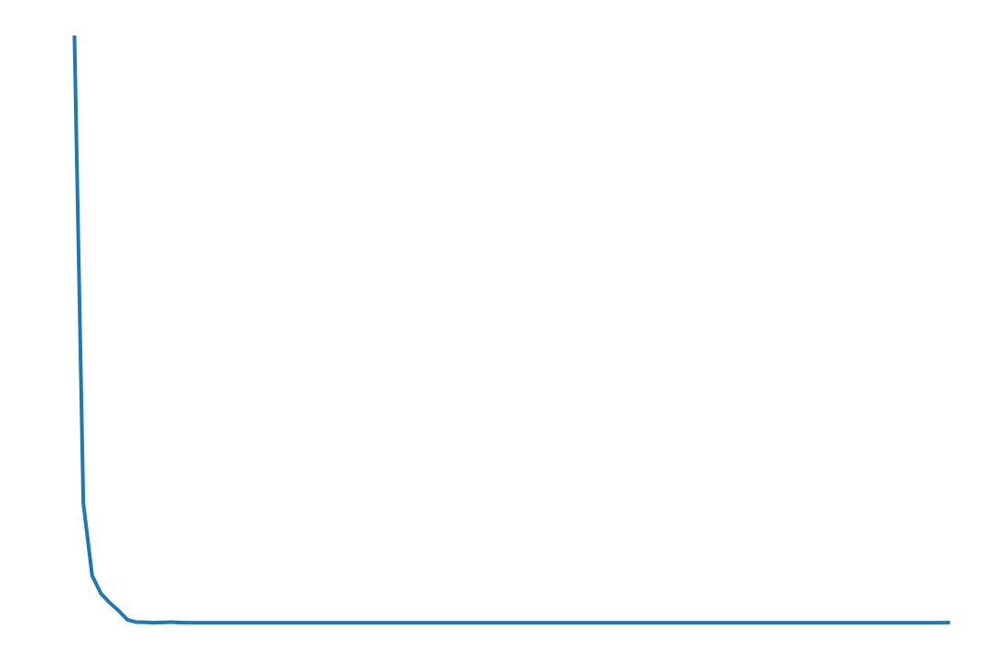

In [74]:
# Histogram of areas
value_list = seg_03_props.Area.values
ft = 20
legend=True
fig, ax = ip.general_plot(dims=(15,10), col='w')
i=0
y, bin_edges = np.histogram(value_list, bins=100)
bin_centers = 0.5*(bin_edges[1:]+bin_edges[:-1])
y_norm = y
#     y_norm = y/np.max(y)
ax.plot(bin_centers, y_norm, lw=4, label=i)
i+=1

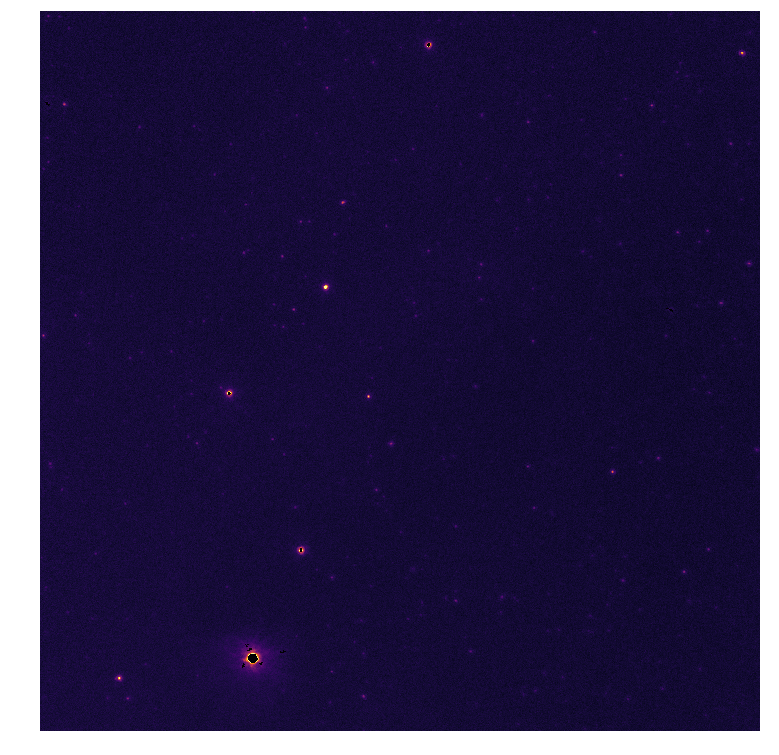

In [78]:
# Filter large spots
# Get large spots
thresh = 50
large_spots = seg_03_props.loc[seg_03_props.Area > thresh, 'ID'].values
# Get mask
seg_npy = seg_03._seg
masks = [seg_npy != ls for ls in large_spots]
# remove spots
im_raw = seg_03.raw_2D
for m in masks:
    im_raw *= m
seg_03.save_intensity_image(image=im_raw, dims=dims, clims=clims,save=False)

2021_04_05_dnafishmethodchar_method_d_plasmid_pos_fov_1


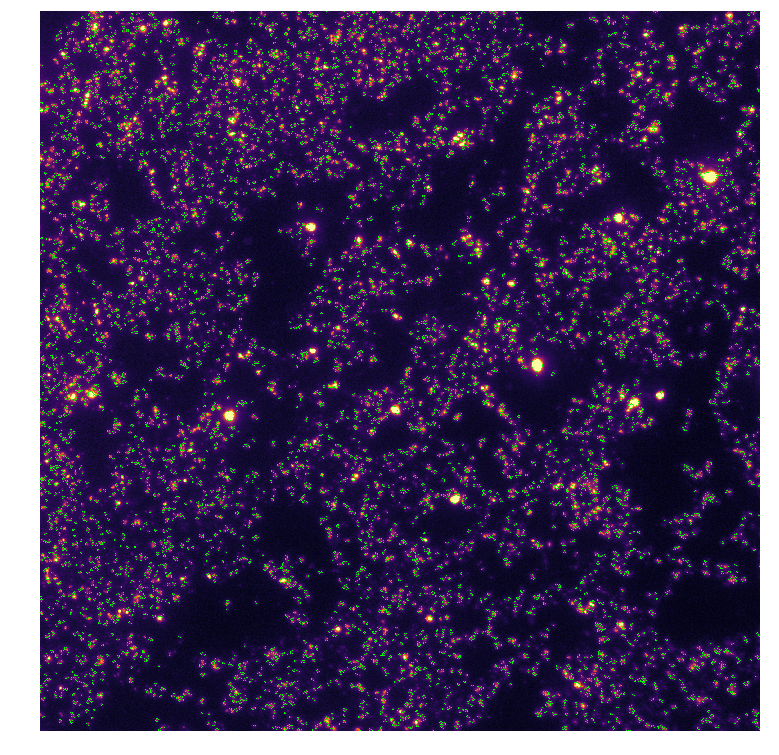

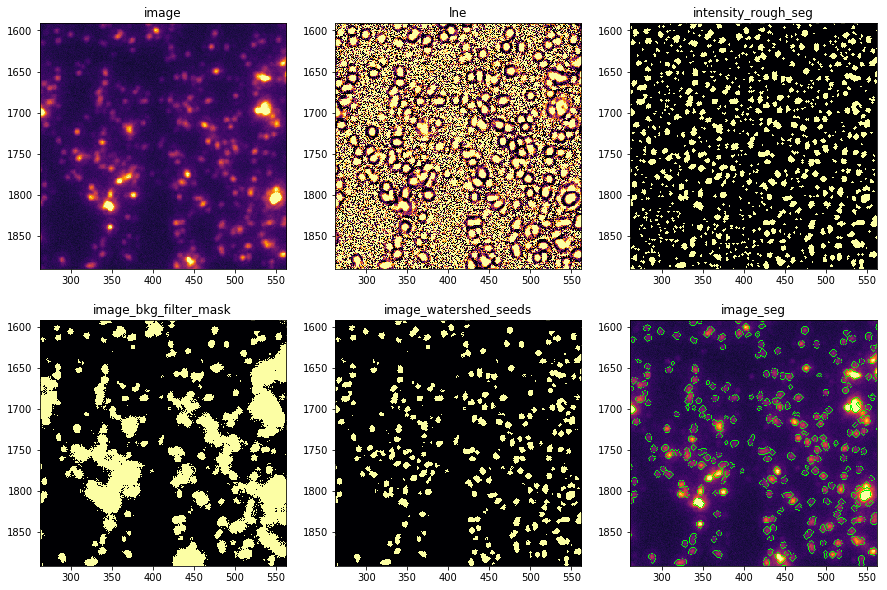

In [86]:
# get positive control spot properties
sn = sn_dict['d']['pos'][1][1]
print(sn)
seg_04 = Segmentation(sample_name=sn, illumination_names=refl, data_dir=data_dir, 
                      flat_field_filename=flat_field_filename, 
                      flat_field_index=flat_field_index,
                      bg_log=True, n_clusters=3, top_n_clust=2, bg_smoothing=0)
seg_04.pick_channel('cy5')
seg_04.flat_field_correction()
seg_04.segment()
seg_04.save_seg(dims=dims, clims=clims, save=False)
seg_04.save_seg_process(zoom_coords=zoom_coords, clims=clims, dims=(15,10), save=False)

In [87]:
seg_04.measure_regionprops()
seg_04_props = pd.read_csv(seg_04.region_props_filename)

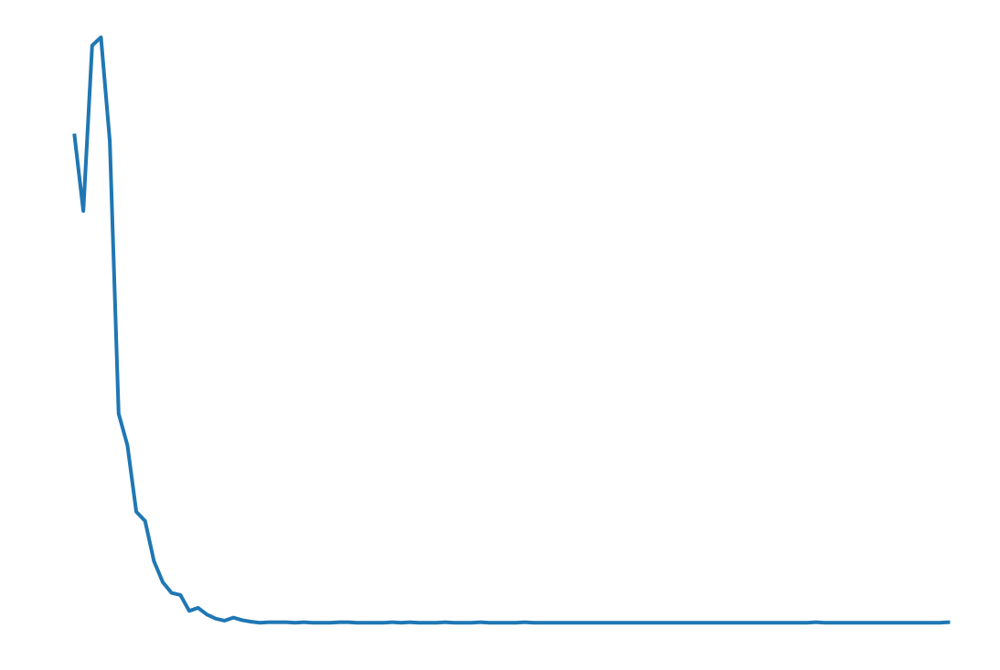

In [92]:
# Histogram of areas positive control
value_list = seg_04_props.Area.values
ft = 20
legend=True
fig, ax = ip.general_plot(dims=(15,10), col='w')
i=0
y, bin_edges = np.histogram(value_list, bins=100)
bin_centers = 0.5*(bin_edges[1:]+bin_edges[:-1])
y_norm = y
#     y_norm = y/np.max(y)
ax.plot(bin_centers, y_norm, lw=4, label=i)
i+=1

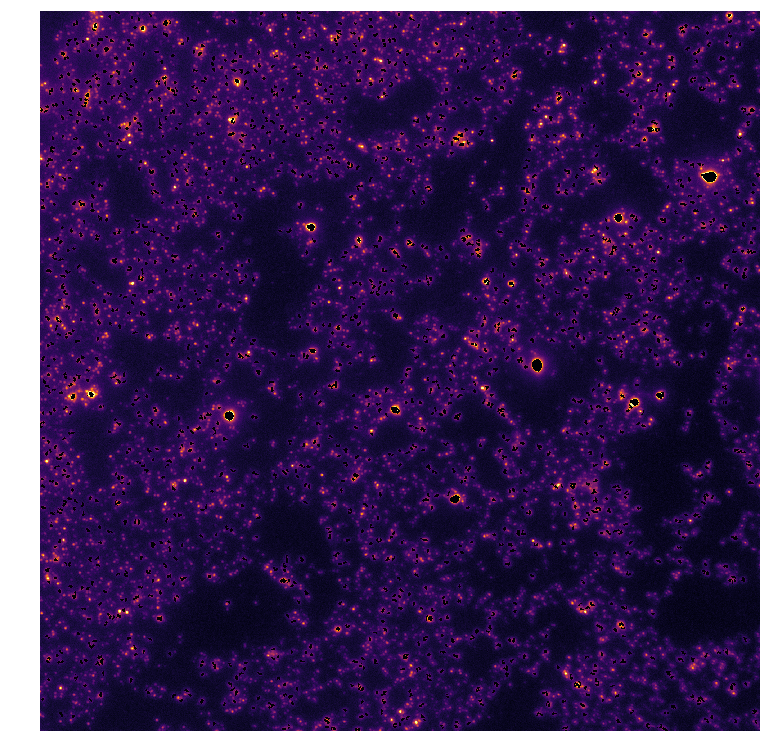

In [93]:
# Filter large spots positive control
# Get large spots
thresh = 100
large_spots = seg_04_props.loc[seg_04_props.Area > thresh, 'ID'].values
# Get mask
seg_npy = seg_04._seg
masks = [seg_npy != ls for ls in large_spots]
# remove spots
im_raw = seg_04.raw_2D
for m in masks:
    im_raw *= m
seg_04.save_intensity_image(image=im_raw, dims=dims, clims=clims,save=False)

/home/bmg224/miniconda3/envs/hiprfish_imaging/lib/python3.5/site-packages/matplotlib/figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


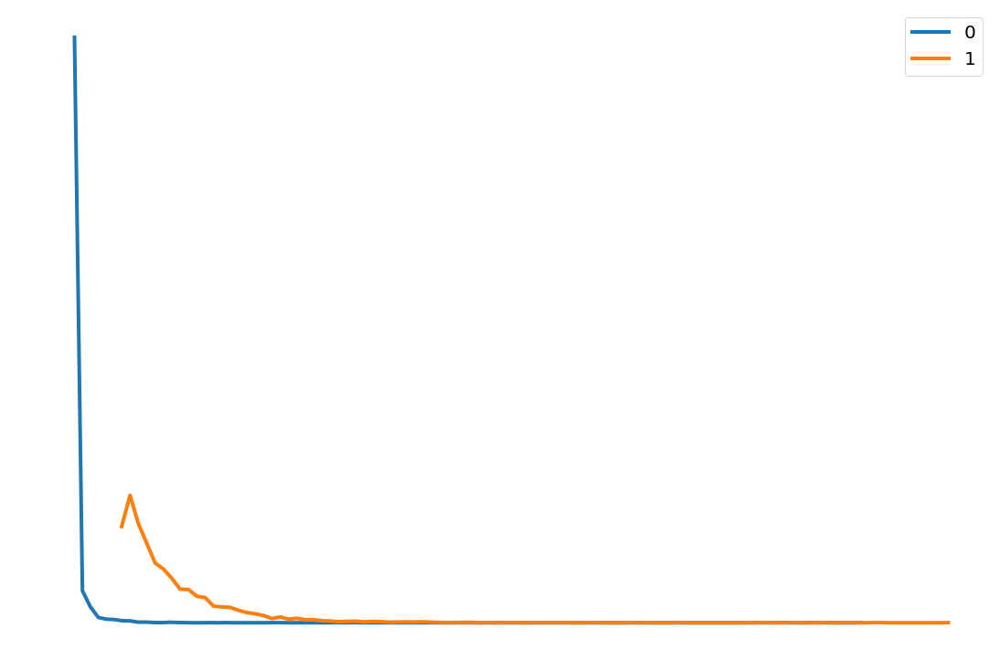

In [88]:
# plot intensity histogram negative vs positive control
value_list = [seg_03_props.Intensity.values, seg_04_props.Intensity.values]
ft = 20
legend=True
fig, ax = ip.general_plot(dims=(15,10), col='w')
i=0
for v in value_list:
    y, bin_edges = np.histogram(v, bins=100)
    bin_centers = 0.5*(bin_edges[1:]+bin_edges[:-1])
    y_norm = y
    #     y_norm = y/np.max(y)
    ax.plot(bin_centers, y_norm, lw=4, label=i)
    i += 1

ax.legend(fontsize=ft)

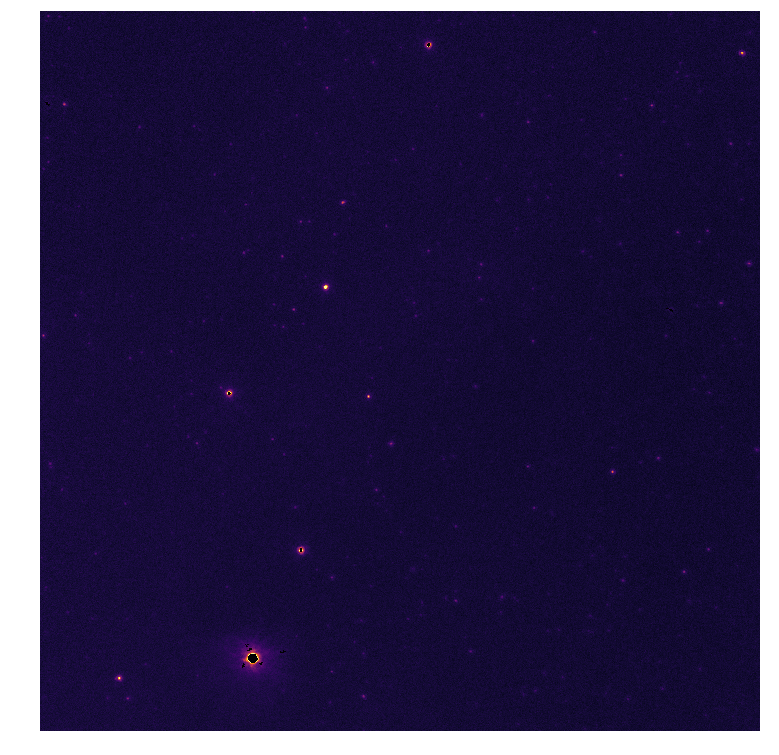

In [89]:
# Filter bright spots
# Get large spots
thresh = 0.35
bright_spots = seg_03_props.loc[seg_03_props.Intensity > thresh, 'ID'].values
# Get mask
seg_npy = seg_03._seg
masks = [seg_npy != ls for ls in large_spots]
# remove spots
im_raw = seg_03.raw_2D
for m in masks:
    im_raw *= m
seg_03.save_intensity_image(image=im_raw, dims=dims, clims=clims,save=False)

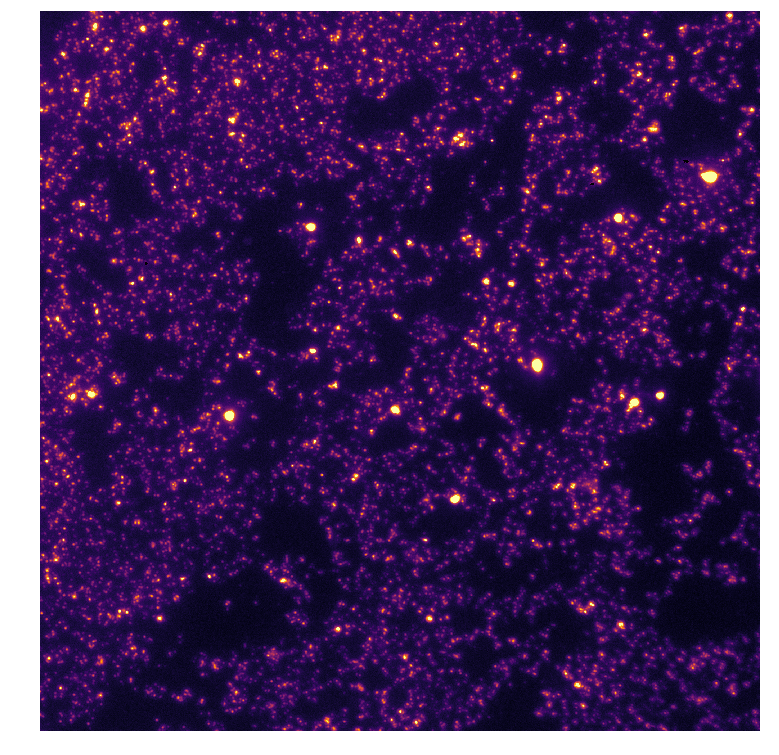

In [90]:
# Filter bright spots
# Get large spots
thresh = 0.35
bright_spots = seg_04_props.loc[seg_04_props.Intensity > thresh, 'ID'].values
# Get mask
seg_npy = seg_04._seg
masks = [seg_npy != ls for ls in large_spots]
# remove spots
im_raw = seg_04.raw_2D
for m in masks:
    im_raw *= m
seg_03.save_intensity_image(image=im_raw, dims=dims, clims=clims,save=False)